In [1]:
import Pkg
Pkg.activate(@__DIR__)

  Activating project at `~/github/code/invariance-code`


In [2]:
using LinearAlgebra, Distributions, SpecialFunctions
using Plots, Plots.Measures, PlotUtils, LaTeXStrings
pyplot(reuse=true, format=:png)

Plots.PyPlotBackend()

---
# Example 5.5 (Möbius band with full twist)

In [3]:
function mobius(θ, t)
    ((1 + t/2 * cos(θ)) .* (cos(θ), sin(θ))..., t/2 * sin(θ))
end

function surf_mobius(; θ=(-π, π), t=(-0.5, 0.5), n=(100, 50), kwargs...)
    pyplot(reuse=true)
    θs = range(θ..., length=n[1])
    ts = range(t..., length=n[2])

    pts = [mobius(θ, t) for θ in θs, t = ts]
    X, Y, Z = map(i -> map(x -> x[i], pts), 1:3)
    
    p = plot(X, Y, Z, st=:surface; kwargs...)
    p = plot(p, X, Y, Z, st=:wireframe; kwargs...)
    p = plot(p, legend=false, ticks=false, grid=false, axis=false)
    close()
    return p
end


function plt_mobius(f; α, θ=(-π, π), t=(-0.5, 0.5), n=(200, 50), kwargs...)
    pyplot(reuse=true)
    θs = range(θ..., length=n[1])
    ts = range(t..., length=n[2])

    pts = [mobius(θ, t) for θ in θs, t = ts]
    X, Y, Z = map(i -> map(x -> x[i], pts), 1:3)
    f_vals = [f(θ, t; α=α) for θ in θs, t = ts]

    p = plot(
        X, Y, Z; fill_z=f_vals,
        st=:surface, lw=0, la=0, 
        clim=(0.0, maximum(f_vals)),
        kwargs...
    )
    close()
    return p
end

plt_params = (;
    legend=false, ticks=false, grid=false, axis=false,
    cb=true, c=:viridis, size=(400, 400), camera=(65, 35)
)

(legend = false, ticks = false, grid = false, axis = false, cb = true, c = :viridis, size = (400, 400), camera = (65, 35))

In [4]:
function ψ(θ, t; vec=false)
    p = ((1 + t * cos(θ)) .* (cos(θ), sin(θ))..., t * sin(θ))
    return !vec ? p : [map(x -> [x], p)...]
end

function ψ_inv(x, y, z)
    θ = atan(y, x)
    t = z / sin(θ)
    return θ, t
end

ψ_inv (generic function with 1 method)

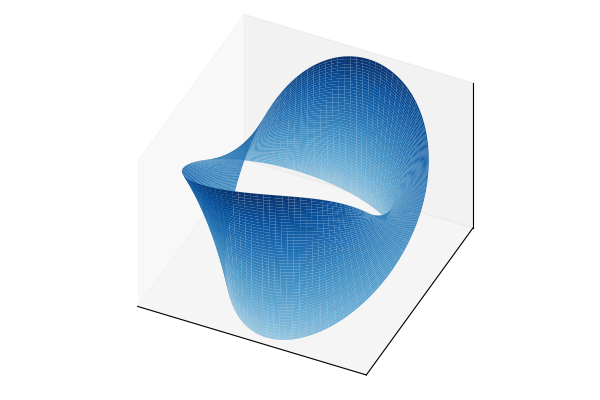

In [5]:
surf_mobius(c=cgrad(:Blues, (0, 1))[end-5:end] |> PlotUtils.ContinuousColorGradient, lw=0.01, camera=(25, 40), cb=false)

In [6]:
φ(θ, t, α=1.0) = mod(α * t + θ - π/2, 2π)

f_vonmises(θ, κ=0.5) = exp(κ * cos(θ)) / (2π * besseli(0, κ))

f_mobius(θ, t; α=1.0) = f_vonmises(φ(θ, ψ_inv(ψ(θ, t)...)[2], α))

f_mobius (generic function with 1 method)

In [7]:
plt2(α; kwargs...) = plt_mobius(f_mobius; α=α, title=L"α=%$(round.(α, digits=2))", plt_params..., camera=(25, 40), kwargs...)

plt2 (generic function with 1 method)

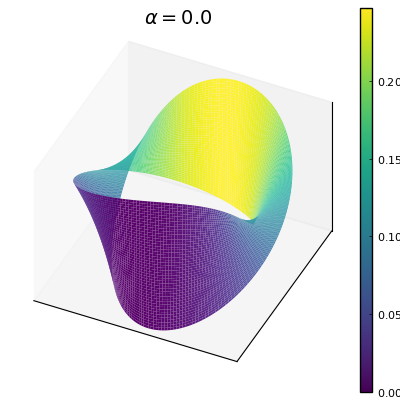

In [8]:
plt2(0.0)

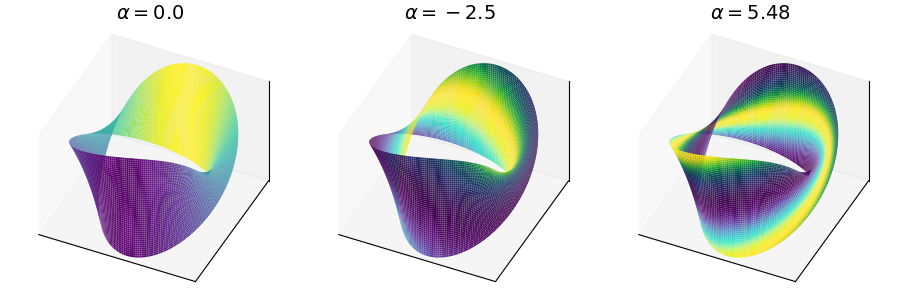

In [9]:
plot(
    plt2(0, cb=false), plt2(-2.5, cb=false), plt2(√30, cb=false),
    layout=(1, 3), size=(900, 300)
)

[ Info: Saved animation to /Users/svishwanath/github/code/invariance-code/tmp.gif


Plots.AnimatedGif("/Users/svishwanath/github/code/invariance-code/tmp.gif")
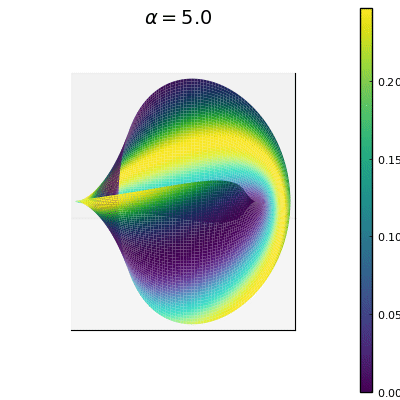

In [10]:
a = @animate for u in range(0, 360, length=40)
    plt2(5, camera=(u, 30))
end
gif(a, fps=5)

[ Info: Saved animation to /Users/svishwanath/github/code/invariance-code/tmp.gif


Plots.AnimatedGif("/Users/svishwanath/github/code/invariance-code/tmp.gif")
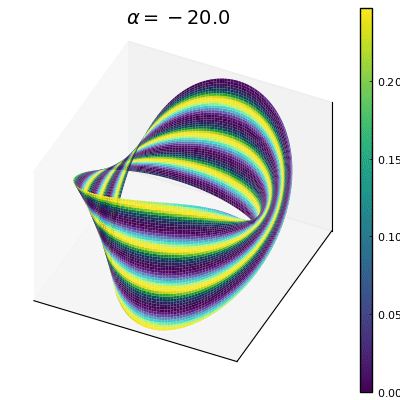

In [11]:
a = @animate for α in [-20:2:-2...; -2:0.25:2; 2:2:20...;]
    plt2(α)
end
gif(a, fps=5)